In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import copy
import time

import sys
sys.path.append('../../')

from data.processing import get_data

import models
import random

from main.seir.fitting import single_fitting_cycle
from main.seir.forecast import get_forecast, forecast_all_trials, create_all_trials_csv, create_decile_csv_new, forecast_top_k_trials
from main.seir.sensitivity import calculate_sensitivity_and_plot
import main.seir.uncertainty as uncertainty_module
from utils.generic.create_report import save_dict_and_create_report_simple
from utils.generic.config import read_config
from utils.generic.enums import Columns
from utils.fitting.loss import Loss_Calculator
from utils.generic.logging import log_wandb
from viz import plot_forecast, plot_top_k_trials, plot_ptiles

import yaml

# seirhd on real data -> off parameters

#### parameter space for SEIRHD:<br>
lockdown_R0: [[0.7, 1.2], uniform]<br>
T_inc: [[4, 5], uniform] #this restriction can also be relaxed<br>
T_inf: [[1, 20], uniform]<br>
T_recov: [[0, 40], uniform]<br>
T_recov_fatal: [[0, 40], uniform]<br>
P_fatal: [[0, 0.1], uniform]<br>
E_hosp_ratio: [[0, 2], uniform]<br>
I_hosp_ratio: [[0, 3], uniform]<br>

In [43]:
n = 10

a         | Maharashtra         | Maharashtra         | Maharashtra         | Maharashtra         |
| district    | Mumbai              | Mumbai              | Mumbai              | Mumbai              | Mumbai              |
| total       | 249759.14           | 250761.57           | 251333.17           | 251839.4            | 252284.5            |
| active      | 18795.86            | 18574.0             | 18672.67            | 18777.6             | 18856.5             |
| recovered   | 220912.86           | 222101.0            | 222553.0            | 222934.6            | 223283.75           |
| deceased    | 10050.43            | 10086.57            | 10107.5             | 10127.2             | 10144.25            |
| tested      | 1440986.43          | 1448174.14          | 1452343.17          | 1455322.8           | 1456838.0           |
| other       | 486.57              | 490.86              | 493.17              | 495.6               | 498.25              |
| daily_cases | 12

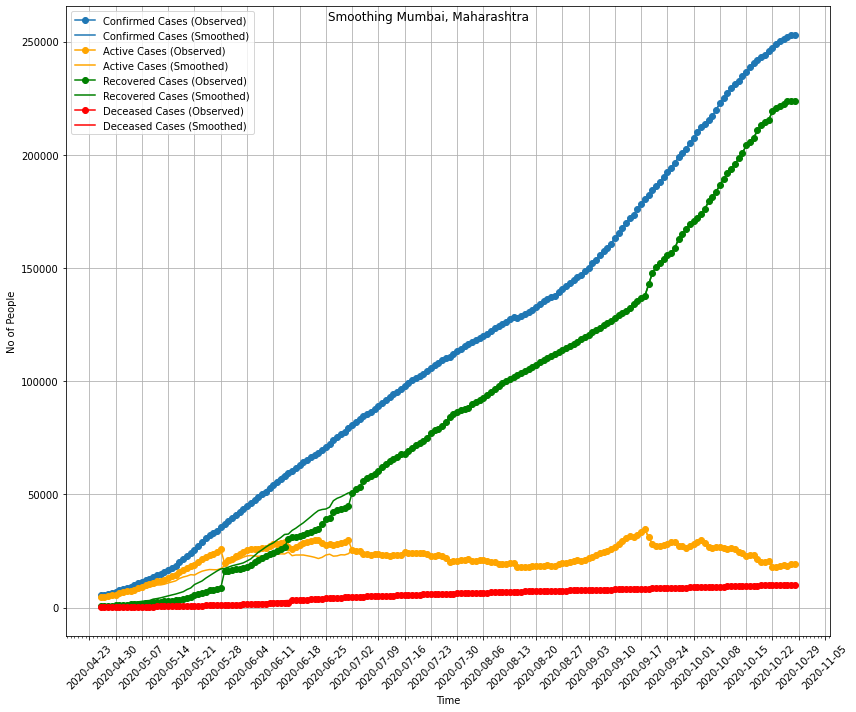

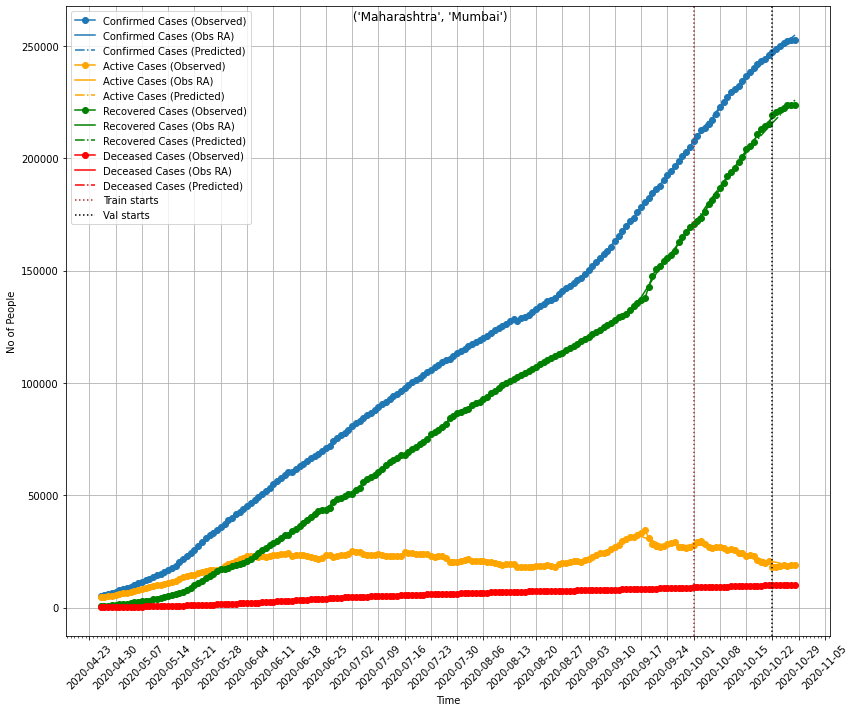

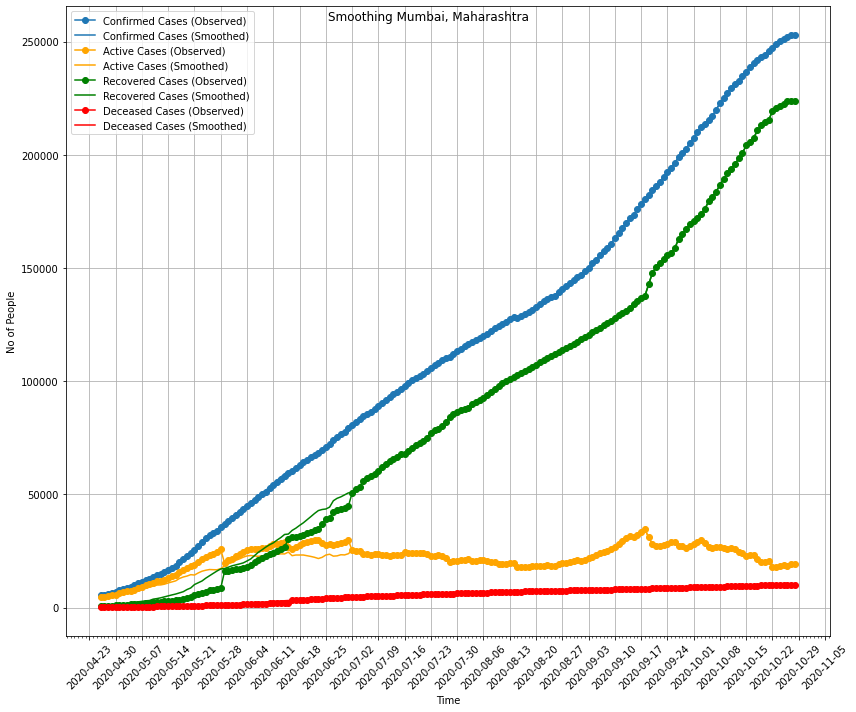

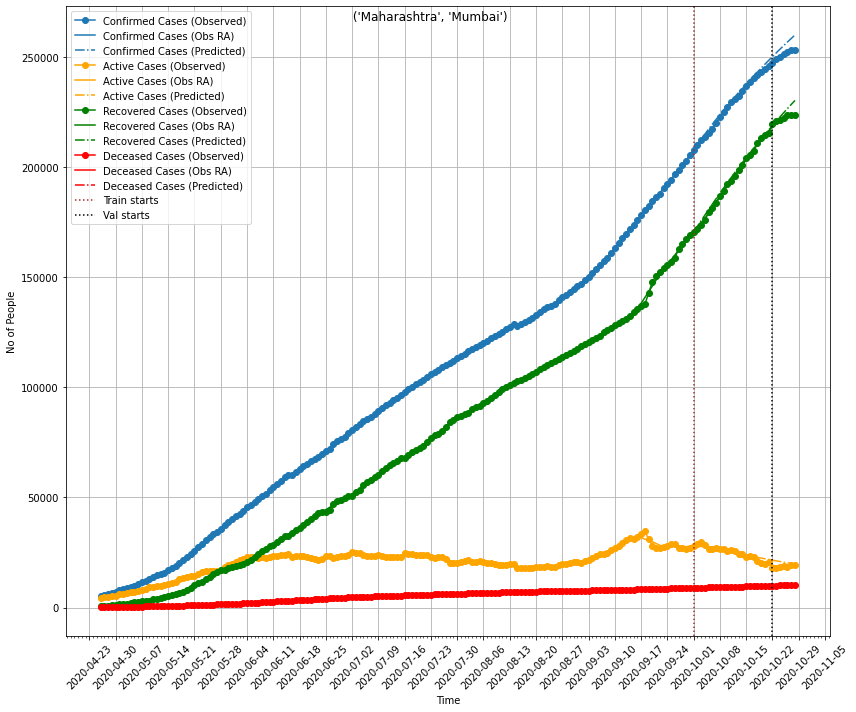

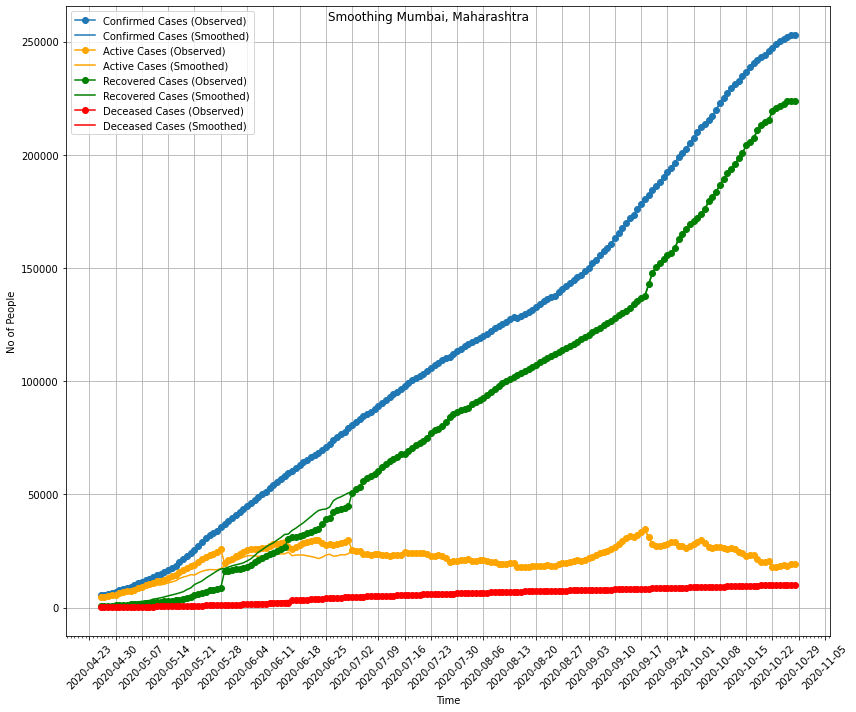

...

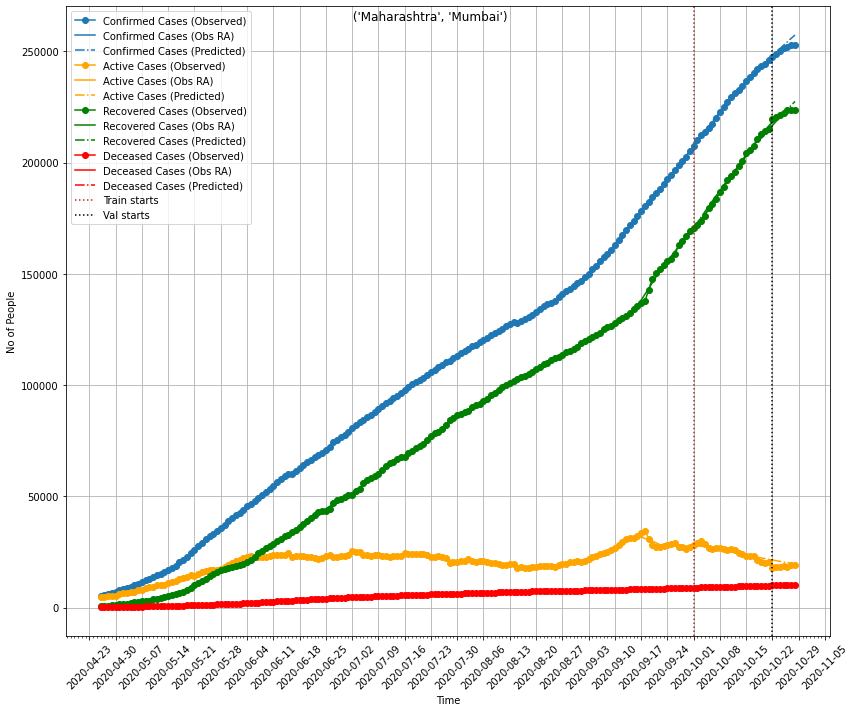

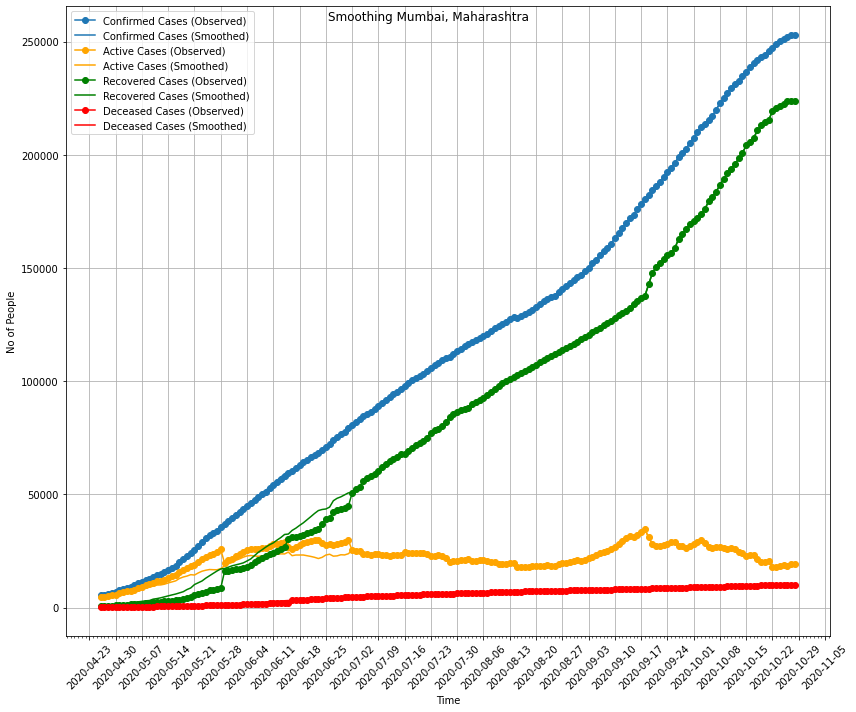

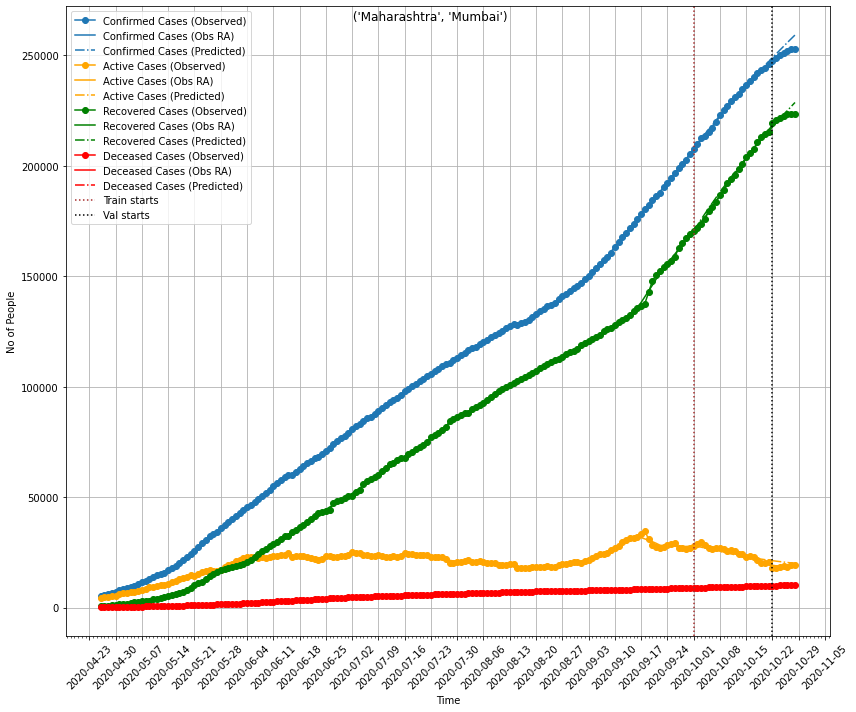

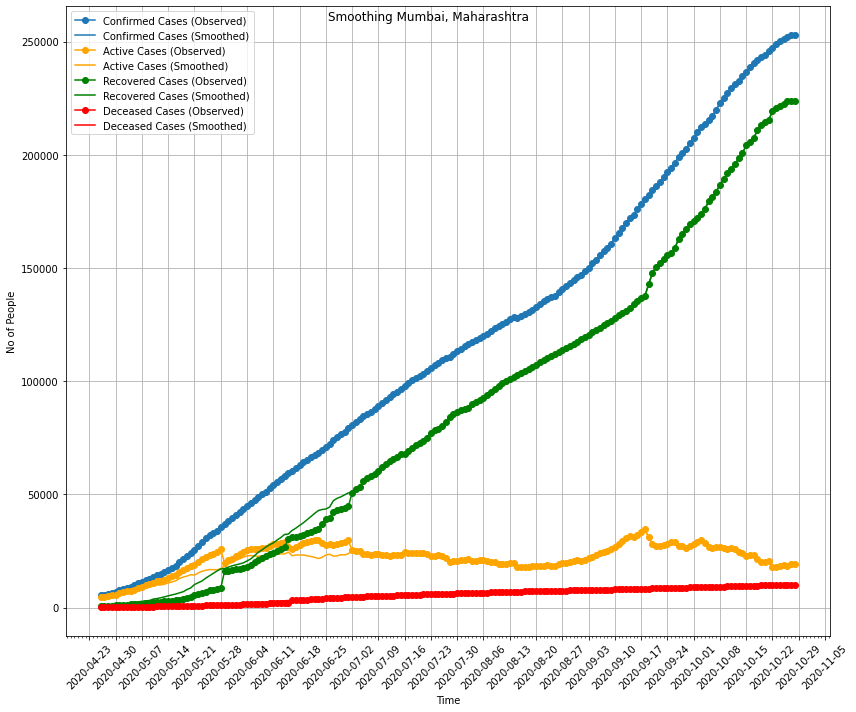

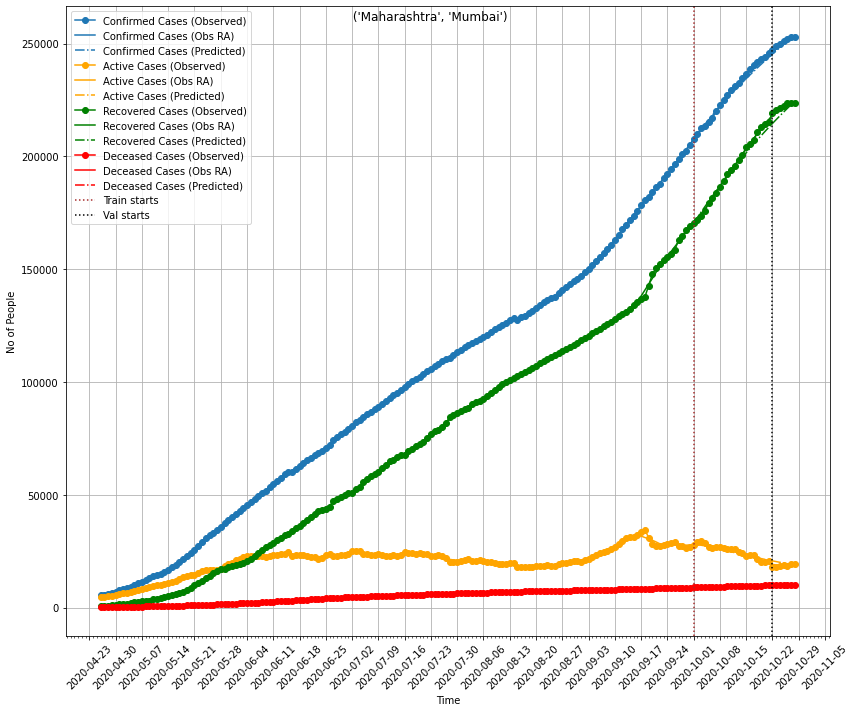

In [44]:
params_list = []
train_loss_list = []
val_loss_list = []
best_train_loss_list = []
best_val_loss_list = []
config_filename = 'experiments/seirhd.yaml'
config = read_config(config_filename)
for i in range(n):
    predictions_dict = {}
    predictions_dict = single_fitting_cycle(**copy.deepcopy(config['fitting'])) 
    params_list.append(predictions_dict['best_params'])
    train_loss_list.append(predictions_dict['df_loss']['train'].to_dict())
    val_loss_list.append(predictions_dict['df_loss']['val'].to_dict())
    best_train_loss_list.append(sum([0.25*i for i in predictions_dict['df_loss']['train'].to_list()]))
    best_val_loss_list.append(sum([0.25*i for i in predictions_dict['df_loss']['train'].to_list()]))

In [45]:
df_params = pd.DataFrame(params_list)
df_params_stats = df_params.describe().iloc[[1,2],:]

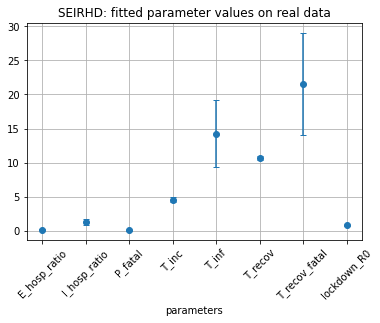

In [46]:
plt.figure()
plt.errorbar(df_params_stats.columns.to_list(), df_params_stats.iloc[0,:].to_list(),
            yerr=df_params_stats.iloc[1,:].to_list(),
            fmt='o', capsize=3)
plt.grid()
plt.xticks(rotation=45)
plt.xlabel('parameters')
plt.title('SEIRHD: fitted parameter values on real data')
plt.show()

In [47]:
df_train_loss = pd.DataFrame(train_loss_list)
df_best_train_loss = pd.DataFrame(best_train_loss_list, columns=['train'])
df_loss = pd.concat([df_train_loss, df_best_train_loss], axis=1, keys=['train','best'])
df_loss_stats = df_loss.describe().iloc[[1,2],:]

['train total',
 'train active',
 'train recovered',
 'train deceased',
 'best train']

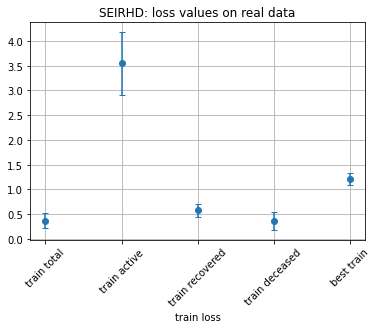

In [48]:
plt.figure()
plt.errorbar([str(i) + " " + str(j) for i,j in df_loss_stats.columns.to_list()], 
            df_loss_stats.iloc[0,:].to_list(),
            yerr=df_loss_stats.iloc[1,:].to_list(),
            fmt='o', capsize=3)
plt.grid()
plt.xticks(rotation=45)
plt.xlabel('train loss')
plt.title('SEIRHD: loss values on real data')
plt.show()

In [49]:
df_val_loss = pd.DataFrame(val_loss_list)
df_best_val_loss = pd.DataFrame(best_val_loss_list, columns=['val'])
df_loss = pd.concat([df_val_loss, df_best_val_loss], axis=1, keys=['val','best'])
df_loss_stats = df_loss.describe().iloc[[1,2],:]

['val total', 'val active', 'val recovered', 'val deceased', 'best val']

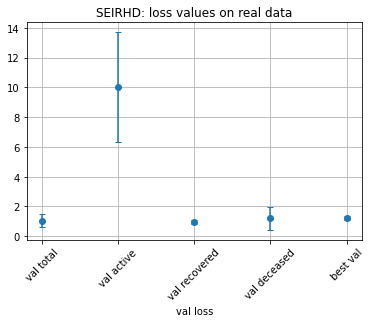

In [50]:
plt.figure()
plt.errorbar([str(i) + " " + str(j) for i,j in df_loss_stats.columns.to_list()], 
            df_loss_stats.iloc[0,:].to_list(),
            yerr=df_loss_stats.iloc[1,:].to_list(),
            fmt='o', capsize=3)
plt.grid()
plt.xticks(rotation=45)
plt.xlabel('val loss')
plt.title('SEIRHD: loss values on real data')
plt.show()

# seirhd on simulated data (undetected) -> low loss, off parameters

### simulated data

### parameters used to generate data:<br>
beta: 0.211<br>
T_inc: 5<br>
T_inf_D: 3.3<br>
T_inf_U: 5.5<br>
d: 0.3<br>
T_recov_severe: 21<br>
T_recov_fatal: 25<br>
P_fatal: 0.3<br>
E_hosp_ratio: 2<br>
I_D_hosp_ratio: 2<br>
I_U_hosp_ratio: 3<br>
psi: 1<br>

### parameter space for SEIRHD:<br>
lockdown_R0: [[0.7, 1.2], uniform]<br>
T_inc: [[4, 5], uniform]<br>
T_inf: [[1, 20], uniform]<br>
T_recov_severe: [[0, 40], uniform]<br>
T_recov_fatal: [[0, 40], uniform]<br>
P_fatal: [[0, 0.5], uniform]<br>
E_hosp_ratio: [[0, 2], uniform]<br>
I_hosp_ratio: [[0, 3], uniform]<br>


In [65]:
n = 10

            | 48                  | 49                  |
|-------------+---------------------+---------------------+---------------------+---------------------+---------------------|
| Unnamed: 0  | 45.0                | 46.0                | 47.0                | 48.0                | 49.0                |
| date        | 2020-09-21 00:00:00 | 2020-09-22 00:00:00 | 2020-09-23 00:00:00 | 2020-09-24 00:00:00 | 2020-09-25 00:00:00 |
| S           | 9166406.0           | 9155597.0           | 9144868.0           | 9134220.0           | 9123653.0           |
| E           | 56146.0             | 55764.0             | 55379.0             | 54990.0             | 54597.0             |
| I_D         | 11356.0             | 11283.0             | 11209.0             | 11135.0             | 11059.0             |
| I_U         | 44737.0             | 44461.0             | 44183.0             | 43901.0             | 43616.0             |
| P_U         | 403725.0            | 411834.0            | 

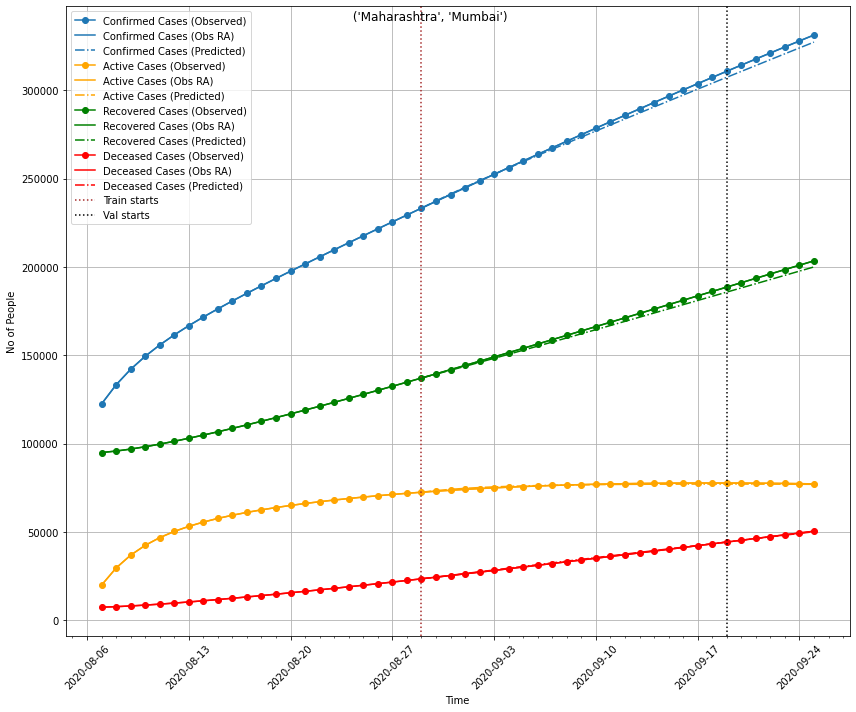

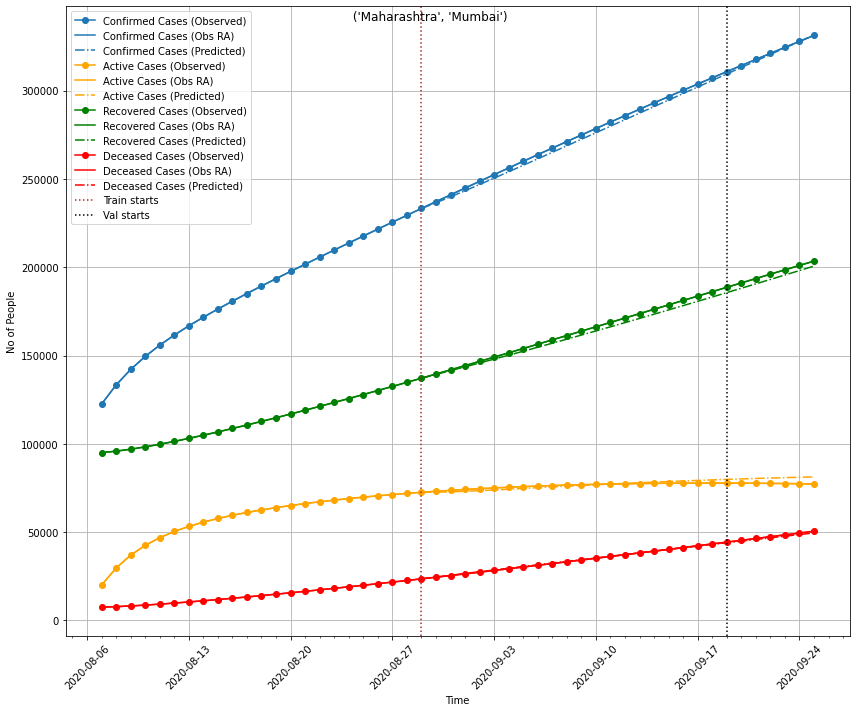

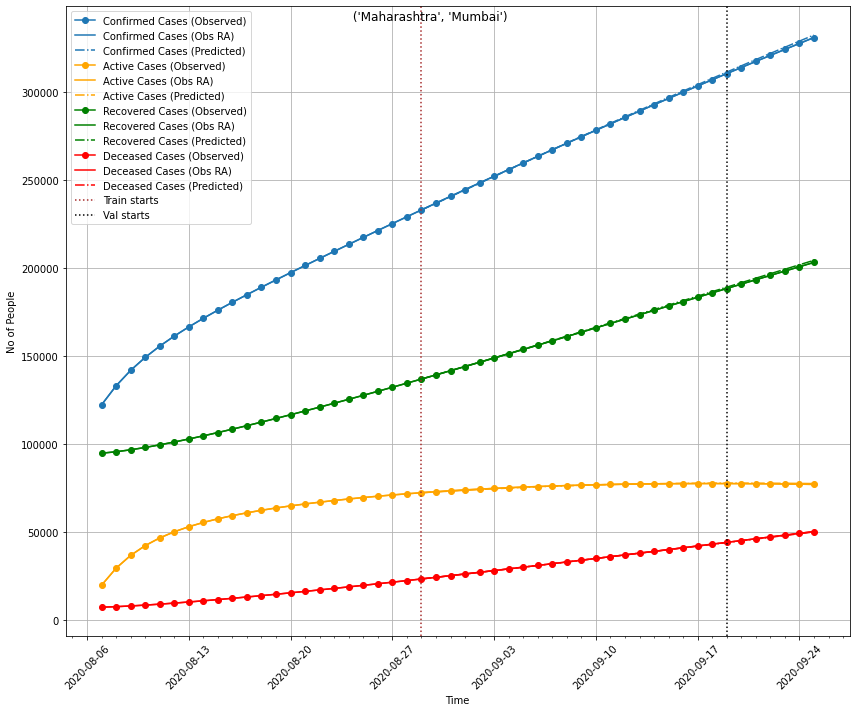

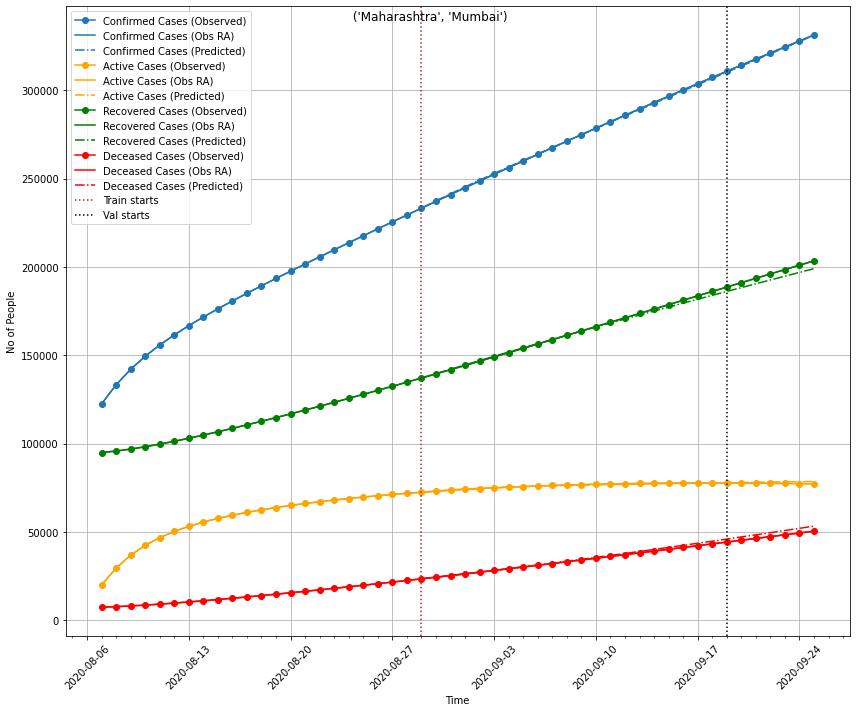

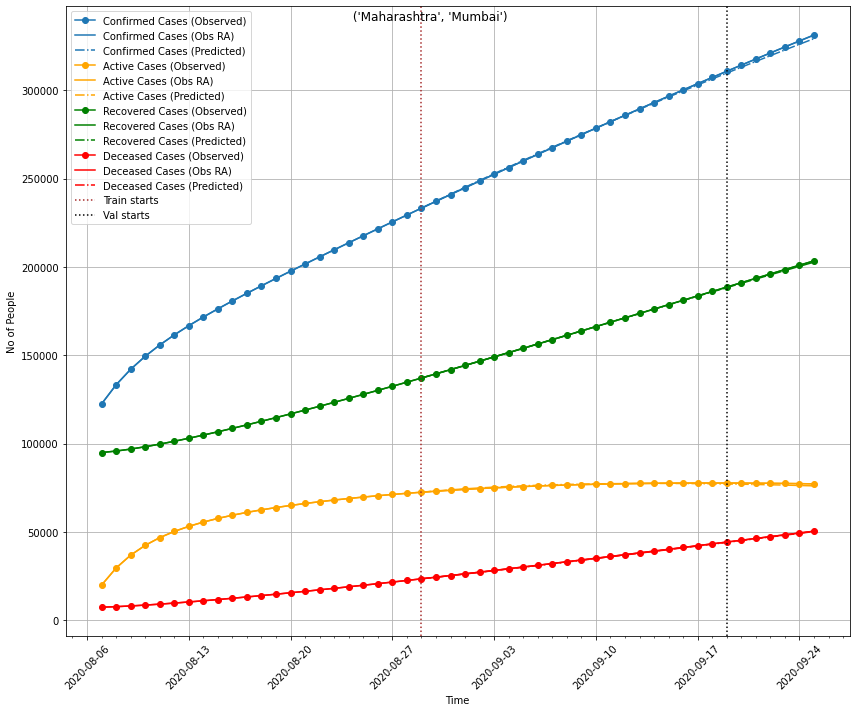

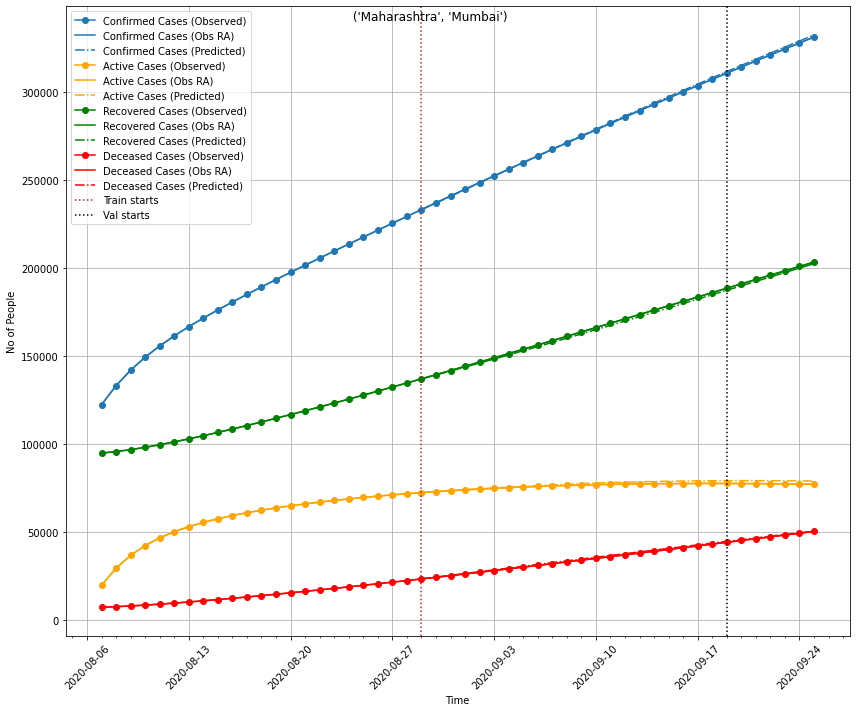

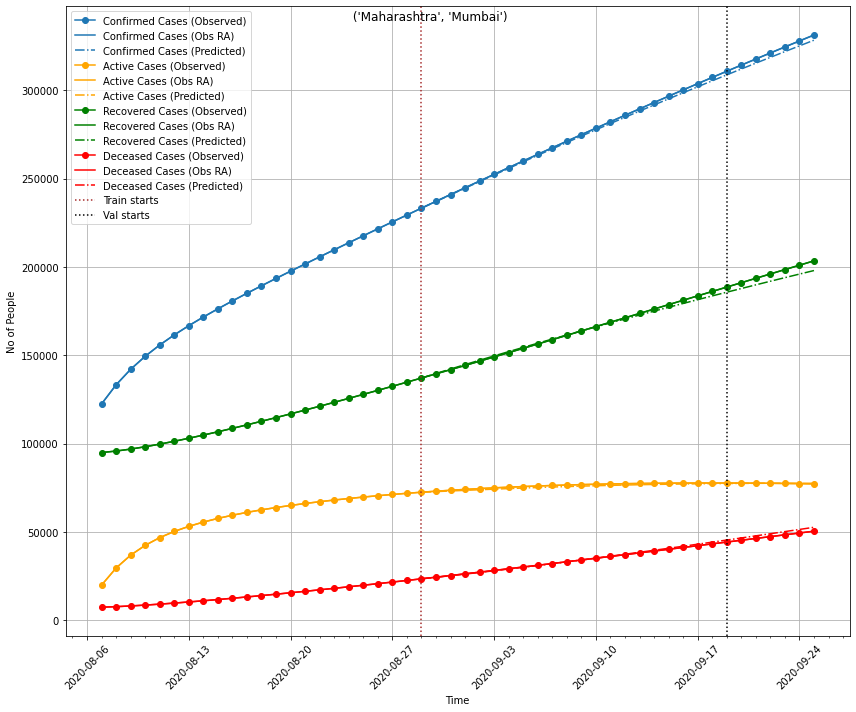

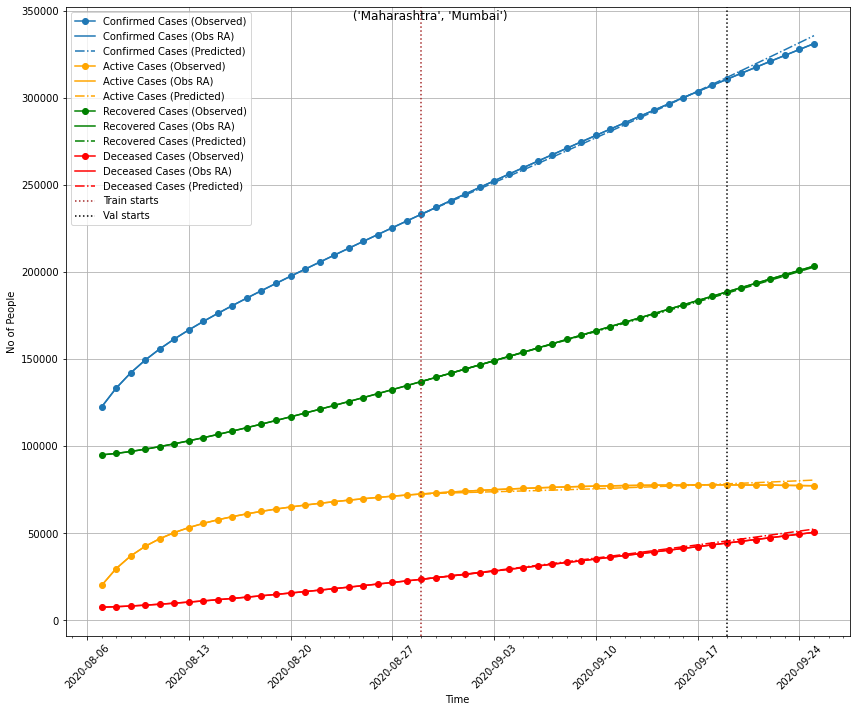

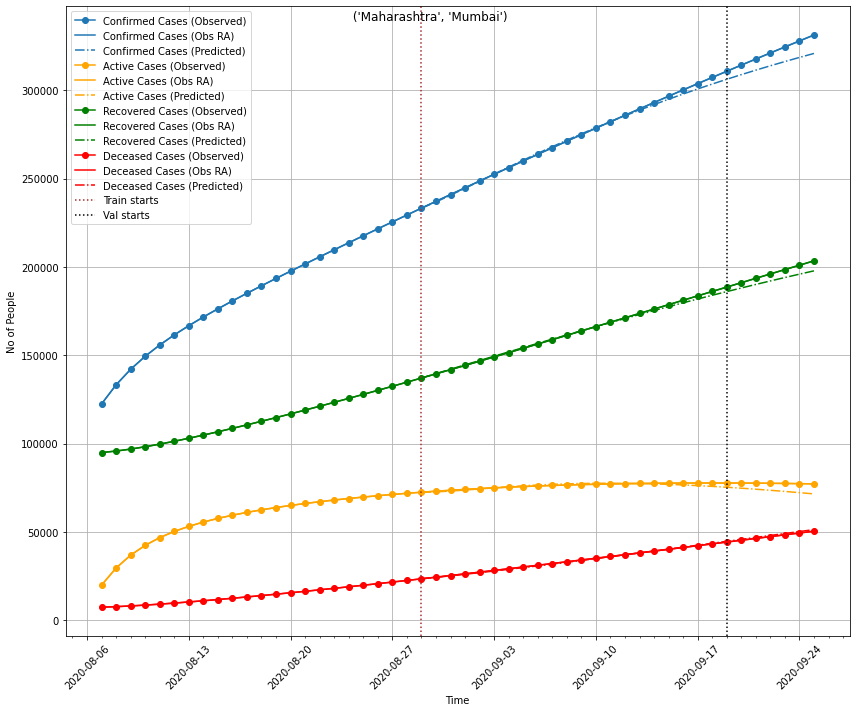

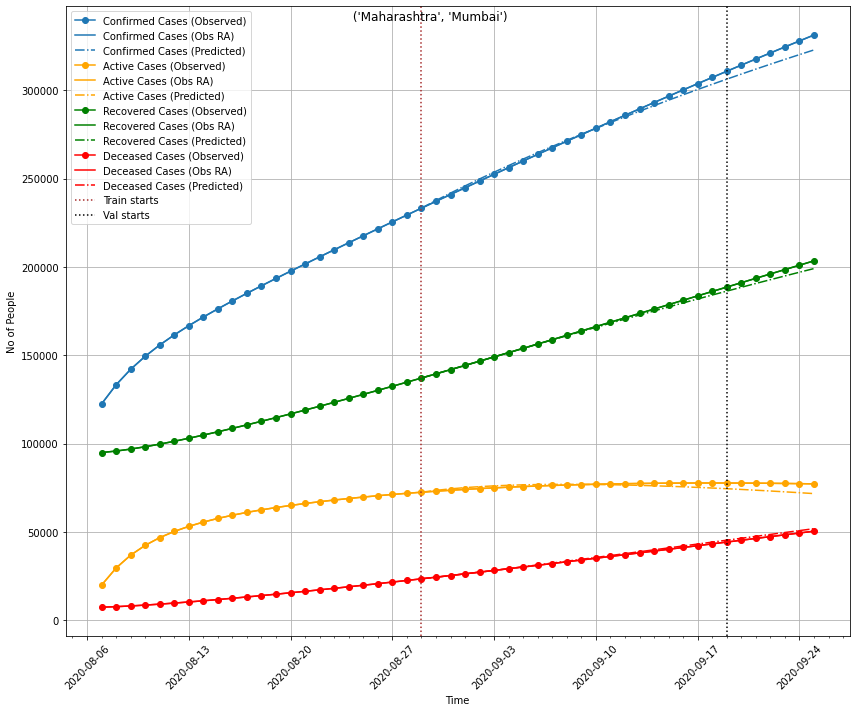

In [73]:
params_list = []
train_loss_list = []
val_loss_list = []
best_train_loss_list = []
best_val_loss_list = []
config_filename = 'experiments/seirhd.yaml'
config = read_config(config_filename)
for i in range(n):
    predictions_dict = {}
    predictions_dict = single_fitting_cycle(**copy.deepcopy(config['fitting'])) 
    params_list.append(predictions_dict['best_params'])
    train_loss_list.append(predictions_dict['df_loss']['train'].to_dict())
    val_loss_list.append(predictions_dict['df_loss']['val'].to_dict())
    best_train_loss_list.append(sum([0.25*i for i in predictions_dict['df_loss']['train'].to_list()]))
    best_val_loss_list.append(sum([0.25*i for i in predictions_dict['df_loss']['train'].to_list()]))

In [74]:
df_params = pd.DataFrame(params_list)
df_params_stats = df_params.describe().iloc[[1,2],:]

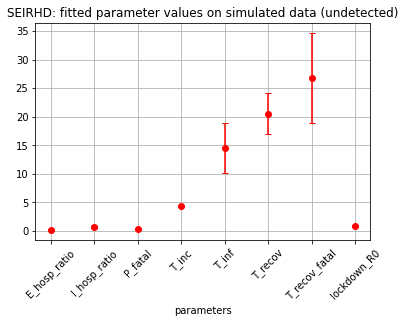

In [88]:
plt.figure()
plt.errorbar(df_params_stats.columns.to_list(), df_params_stats.iloc[0,:].to_list(),
            yerr=df_params_stats.iloc[1,:].to_list(),
            fmt='o', capsize=3, color='r')
plt.grid()
plt.xticks(rotation=45)
plt.xlabel('parameters')
plt.title('SEIRHD: fitted parameter values on simulated data (undetected)')
plt.show()

In [76]:
df_train_loss = pd.DataFrame(train_loss_list)
df_best_train_loss = pd.DataFrame(best_train_loss_list, columns=['train'])
df_loss = pd.concat([df_train_loss, df_best_train_loss], axis=1, keys=['train','best'])
df_loss_stats = df_loss.describe().iloc[[1,2],:]

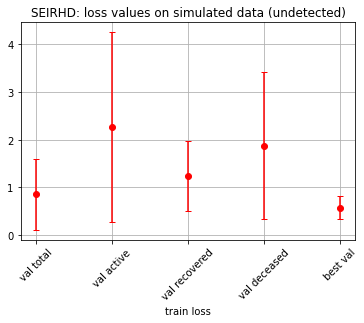

In [89]:
plt.figure()
plt.errorbar([str(i) + " " + str(j) for i,j in df_loss_stats.columns.to_list()], 
            df_loss_stats.iloc[0,:].to_list(),
            yerr=df_loss_stats.iloc[1,:].to_list(),
            fmt='o', capsize=3, color='r')
plt.grid()
plt.xticks(rotation=45)
plt.xlabel('train loss')
plt.title('SEIRHD: loss values on simulated data (undetected)')
plt.show()

In [78]:
df_val_loss = pd.DataFrame(val_loss_list)
df_best_val_loss = pd.DataFrame(best_val_loss_list, columns=['val'])
df_loss = pd.concat([df_val_loss, df_best_val_loss], axis=1, keys=['val','best'])
df_loss_stats = df_loss.describe().iloc[[1,2],:]

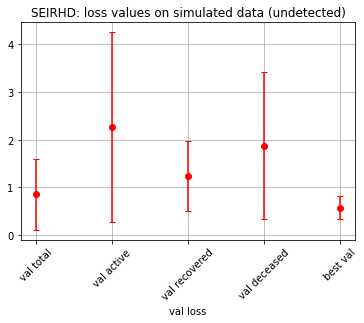

In [90]:
plt.figure()
plt.errorbar([str(i) + " " + str(j) for i,j in df_loss_stats.columns.to_list()], 
            df_loss_stats.iloc[0,:].to_list(),
            yerr=df_loss_stats.iloc[1,:].to_list(),
            fmt='o', capsize=3, color='r')
plt.grid()
plt.xticks(rotation=45)
plt.xlabel('val loss')
plt.title('SEIRHD: loss values on simulated data (undetected)')
plt.show()

# seirhd constrain the parameters -> loss increases

### real data

### parameter space for SEIRHD:<br>
lockdown_R0: [0.7, 1.2, uniform]<br>
T_inc: [4, 5, uniform]<br>
T_inf: [3, 4, uniform]<br>
T_recov_severe: [0, 40, uniform]<br>
T_recov_fatal: [0, 40, uniform]<br>
P_fatal: [0, 0.5, uniform]<br>
E_hosp_ratio: [0, 2, uniform]<br>
I_hosp_ratio: [0, 3, uniform]<br>

In [113]:
n = 10

a         | Maharashtra         | Maharashtra         | Maharashtra         | Maharashtra         |
| district    | Mumbai              | Mumbai              | Mumbai              | Mumbai              | Mumbai              |
| total       | 249759.14           | 250761.57           | 251333.17           | 251839.4            | 252284.5            |
| active      | 18795.86            | 18574.0             | 18672.67            | 18777.6             | 18856.5             |
| recovered   | 220912.86           | 222101.0            | 222553.0            | 222934.6            | 223283.75           |
| deceased    | 10050.43            | 10086.57            | 10107.5             | 10127.2             | 10144.25            |
| tested      | 1440986.43          | 1448174.14          | 1452343.17          | 1455322.8           | 1456838.0           |
| other       | 486.57              | 490.86              | 493.17              | 495.6               | 498.25              |
| daily_cases | 12

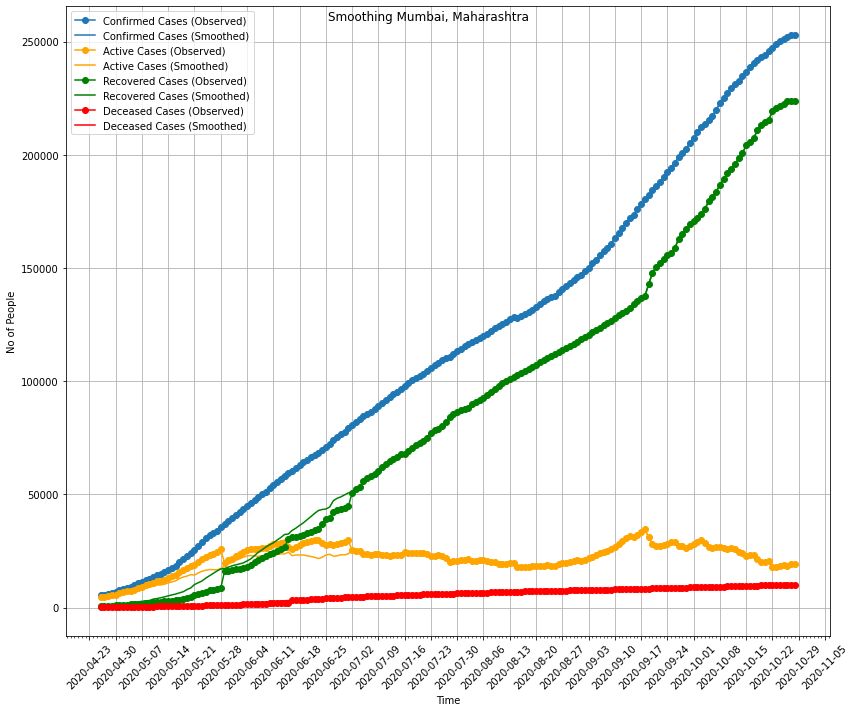

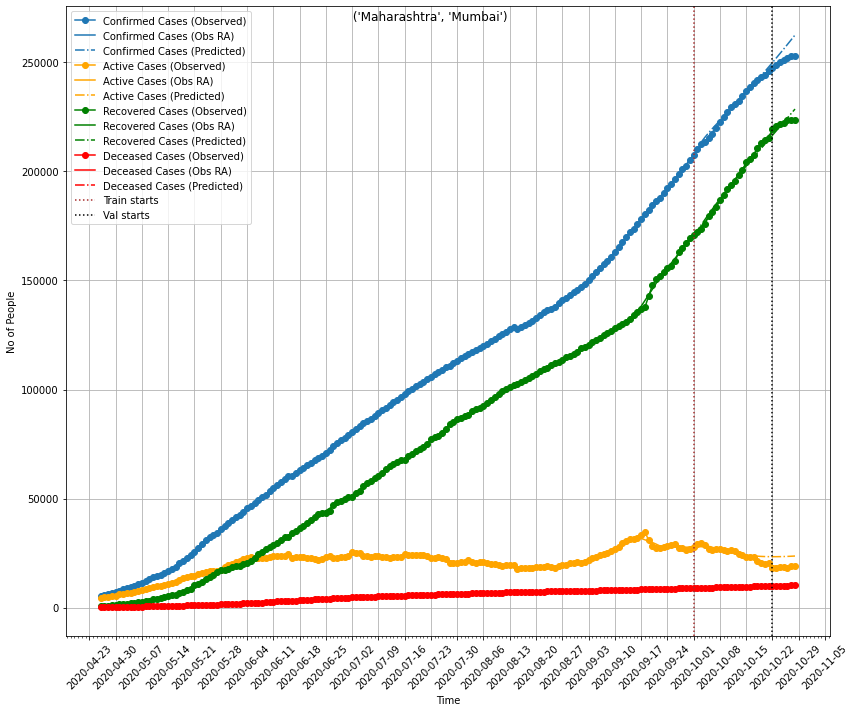

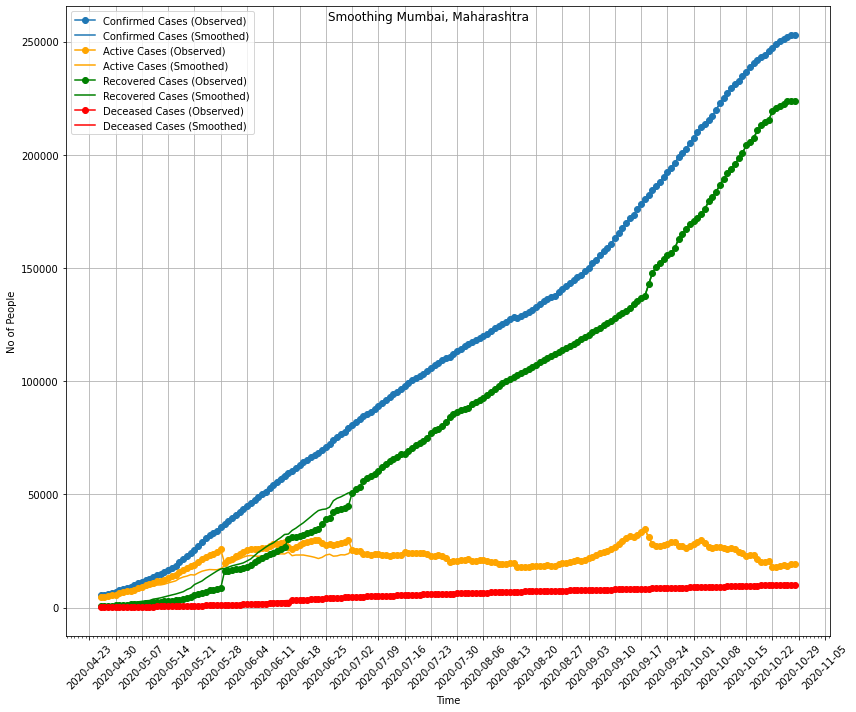

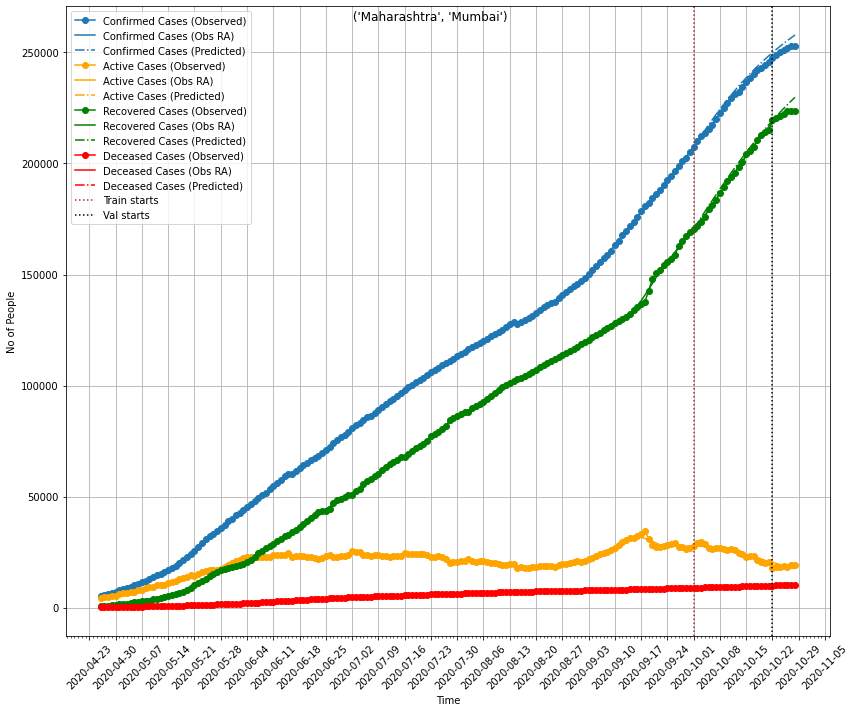

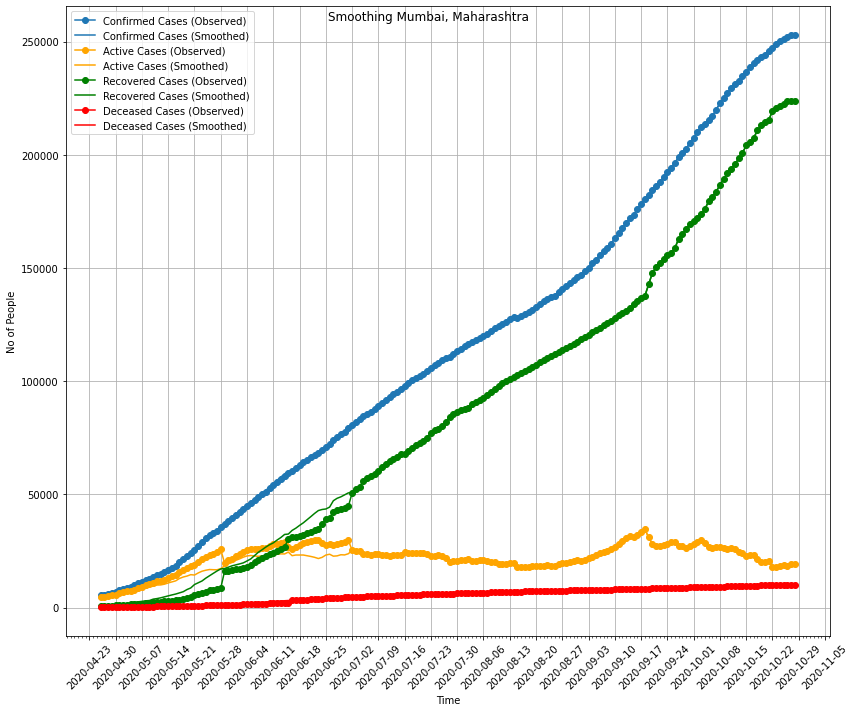

...

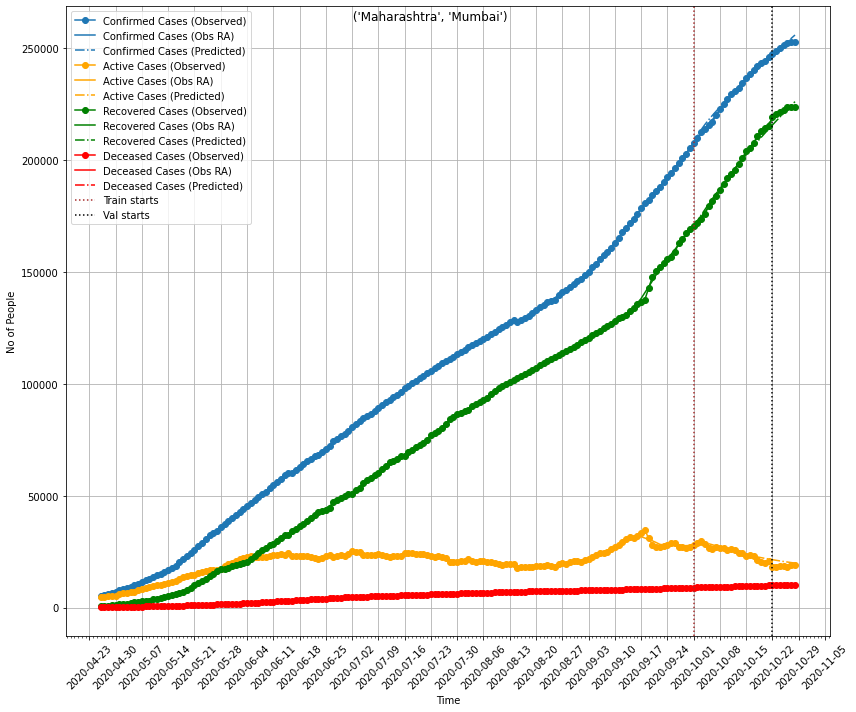

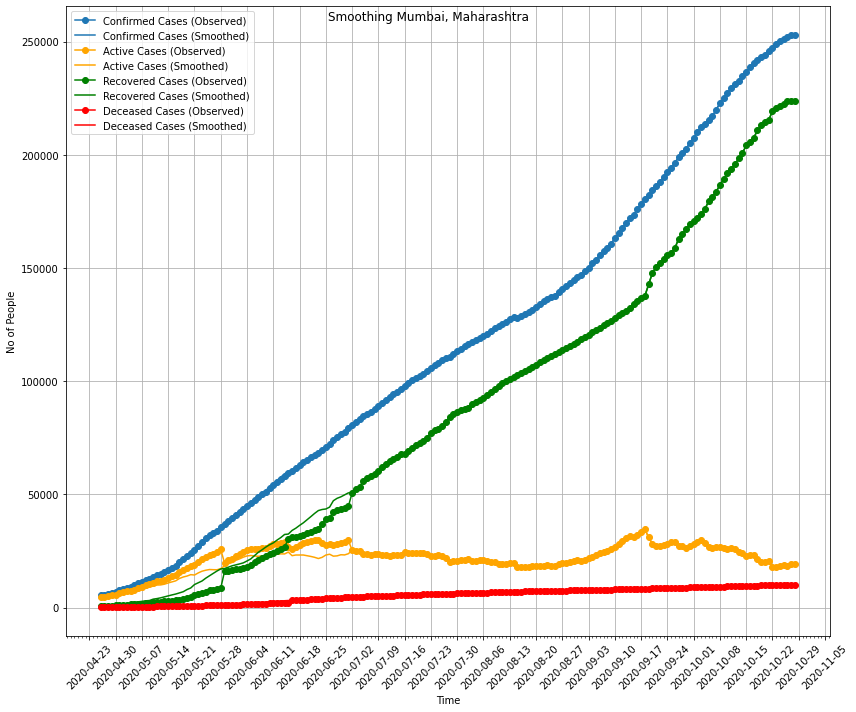

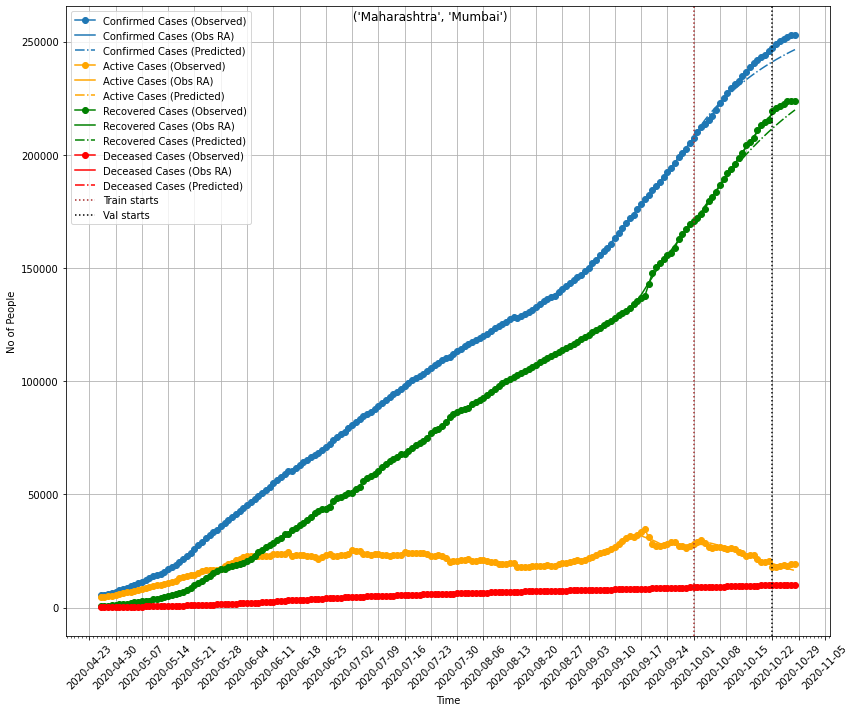

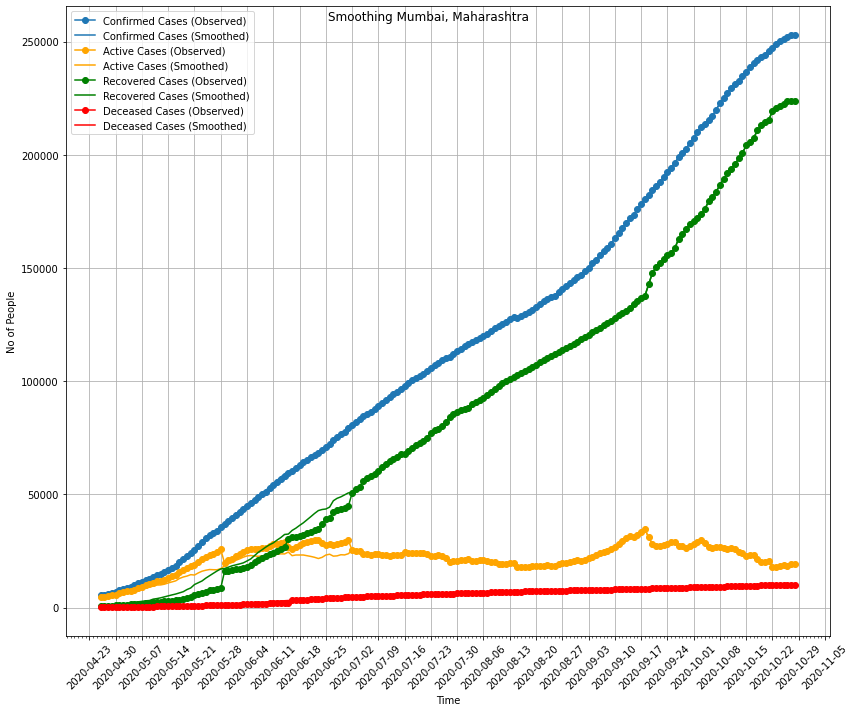

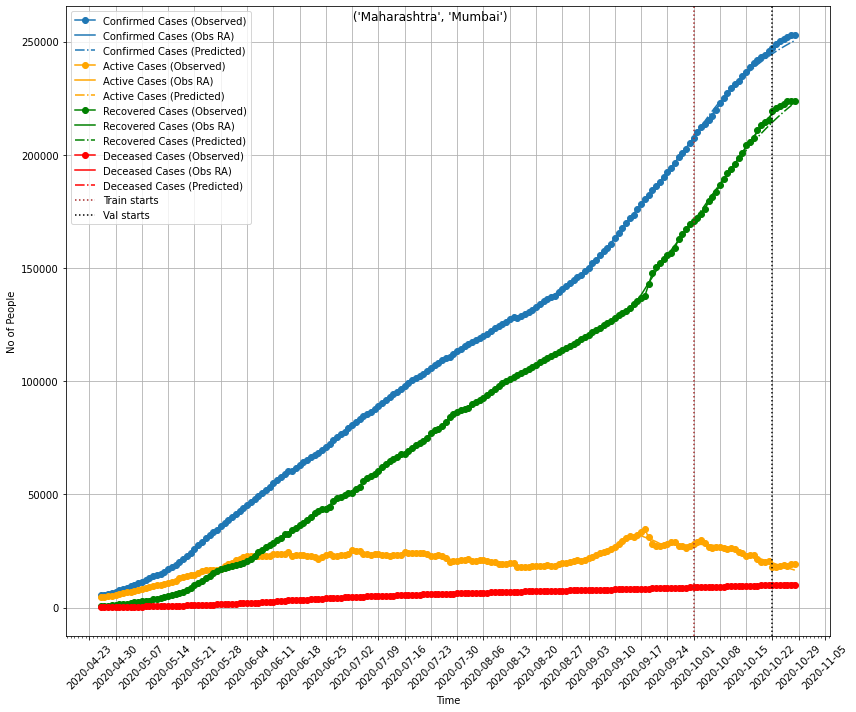

In [114]:
params_list = []
train_loss_list = []
val_loss_list = []
best_train_loss_list = []
best_val_loss_list = []
config_filename = 'experiments/seirhd.yaml'
config = read_config(config_filename)
for i in range(n):
    predictions_dict = {}
    predictions_dict = single_fitting_cycle(**copy.deepcopy(config['fitting'])) 
    params_list.append(predictions_dict['best_params'])
    train_loss_list.append(predictions_dict['df_loss']['train'].to_dict())
    val_loss_list.append(predictions_dict['df_loss']['val'].to_dict())
    best_train_loss_list.append(sum([0.25*i for i in predictions_dict['df_loss']['train'].to_list()]))
    best_val_loss_list.append(sum([0.25*i for i in predictions_dict['df_loss']['train'].to_list()]))

In [115]:
df_params = pd.DataFrame(params_list)
df_params_stats = df_params.describe().iloc[[1,2],:]

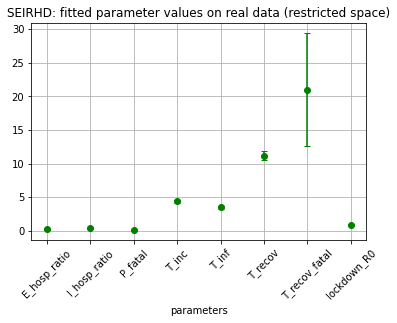

In [116]:
plt.figure()
plt.errorbar(df_params_stats.columns.to_list(), df_params_stats.iloc[0,:].to_list(),
            yerr=df_params_stats.iloc[1,:].to_list(),
            fmt='o', capsize=3, color='g')
plt.grid()
plt.xticks(rotation=45)
plt.xlabel('parameters')
plt.title('SEIRHD: fitted parameter values on real data (restricted space)')
plt.show()

In [117]:
df_train_loss = pd.DataFrame(train_loss_list)
df_best_train_loss = pd.DataFrame(best_train_loss_list, columns=['train'])
df_loss = pd.concat([df_train_loss, df_best_train_loss], axis=1, keys=['train','best'])
df_loss_stats = df_loss.describe().iloc[[1,2],:]

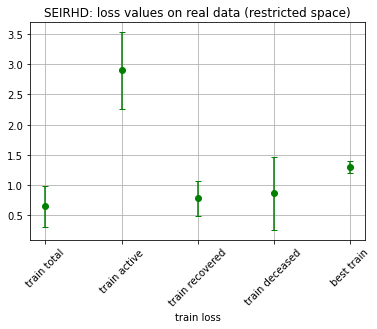

In [118]:
plt.figure()
plt.errorbar([str(i) + " " + str(j) for i,j in df_loss_stats.columns.to_list()], 
            df_loss_stats.iloc[0,:].to_list(),
            yerr=df_loss_stats.iloc[1,:].to_list(),
            fmt='o', capsize=3, color='g')
plt.grid()
plt.xticks(rotation=45)
plt.xlabel('train loss')
plt.title('SEIRHD: loss values on real data (restricted space)')
plt.show()

In [119]:
df_val_loss = pd.DataFrame(val_loss_list)
df_best_val_loss = pd.DataFrame(best_val_loss_list, columns=['val'])
df_loss = pd.concat([df_val_loss, df_best_val_loss], axis=1, keys=['val','best'])
df_loss_stats = df_loss.describe().iloc[[1,2],:]

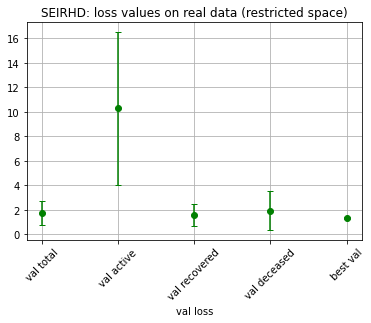

In [120]:
plt.figure()
plt.errorbar([str(i) + " " + str(j) for i,j in df_loss_stats.columns.to_list()], 
            df_loss_stats.iloc[0,:].to_list(),
            yerr=df_loss_stats.iloc[1,:].to_list(),
            fmt='o', capsize=3, color='g')
plt.grid()
plt.xticks(rotation=45)
plt.xlabel('val loss')
plt.title('SEIRHD: loss values on real data (restricted space)')
plt.show()

# undetected model -> better parameters based on intuituin

### real data

### parameter space for undetected model<br>
T_inc: [[4, 6], uniform]<br>
T_inf_D: [[1, 20], uniform]<br>
T_inf_U: [[1, 20], uniform]<br>
T_recov_severe: [[1, 40], uniform]<br>
T_recov_fatal: [[1, 40], uniform]<br>
beta: [[0,0.5], uniform]<br>
d: [[0,1], uniform]<br>
P_fatal: [[0, 0.5], uniform]<br>
I_D_hosp_ratio: [[0,3.0], uniform]<br>
I_U_hosp_ratio: [[0,4.0], uniform]<br>
E_hosp_ratio: [[0,3.0], uniform]<br>

In [121]:
n=1

Performing m1 fit ..
loading from ../../misc/cache/dataframes_ts_28102020_tracker.pkl
186 186
Smoothing 7358 recovered between 2020-05-28 and 2020-04-26 (32) days in a weighted-mag manner
Smoothing 3139 recovered between 2020-06-14 and 2020-04-26 (49) days in a weighted-mag manner
Smoothing 917 deceased between 2020-06-15 and 2020-04-26 (50) days in a weighted-mag manner
Smoothing 2432 recovered between 2020-06-23 and 2020-06-15 (8) days in a weighted-mag manner
Smoothing 2141 recovered between 2020-06-24 and 2020-06-15 (9) days in a weighted-mag manner
Smoothing 5900 recovered between 2020-07-01 and 2020-05-28 (34) days in a weighted-mag manner

splitting data ..
splitting data ..
train
 +-------------+---------------------+---------------------+---------------------+---------------------+---------------------+
|             | 174                 | 175                 | 176                 | 177                 | 178                 |
|-------------+---------------------+-------------

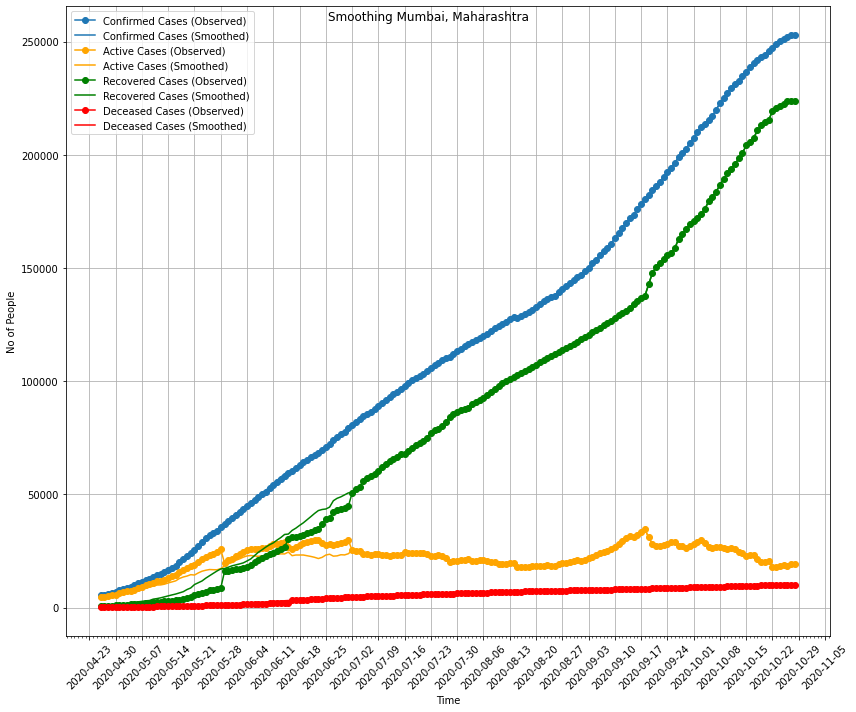

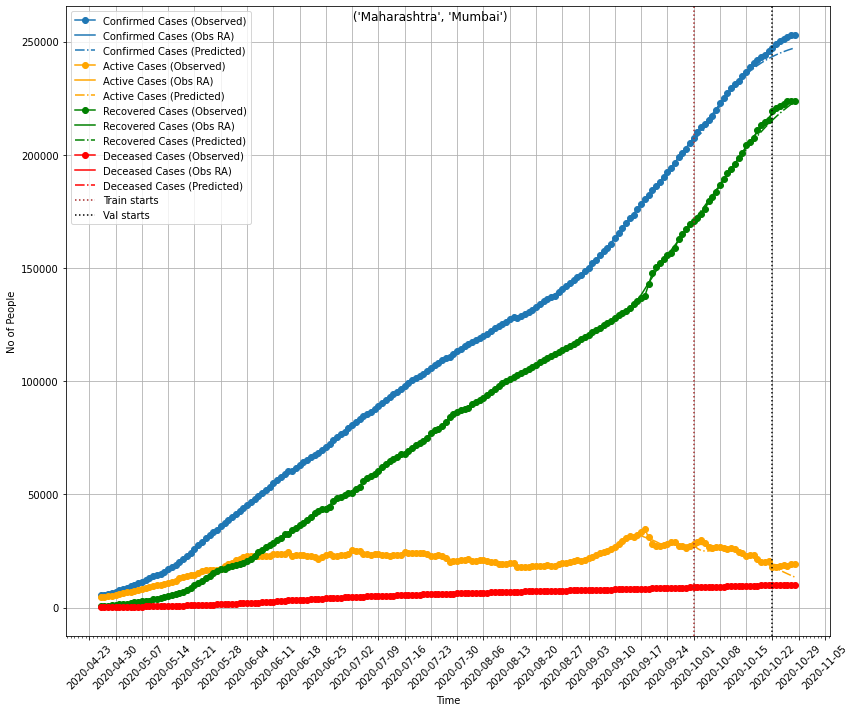

In [127]:
params_list = []
train_loss_list = []
val_loss_list = []
best_train_loss_list = []
best_val_loss_list = []
config_filename = 'experiments/undetected.yaml'
config = read_config(config_filename)
for i in range(n):
    predictions_dict = {}
    predictions_dict = single_fitting_cycle(**copy.deepcopy(config['fitting'])) 
    params_list.append(predictions_dict['best_params'])
    train_loss_list.append(predictions_dict['df_loss']['train'].to_dict())
    val_loss_list.append(predictions_dict['df_loss']['val'].to_dict())
    best_train_loss_list.append(sum([0.25*i for i in predictions_dict['df_loss']['train'].to_list()]))
    best_val_loss_list.append(sum([0.25*i for i in predictions_dict['df_loss']['train'].to_list()]))

In [128]:
df_params = pd.DataFrame(params_list)
df_params_stats = df_params.describe().iloc[[1,2],:]

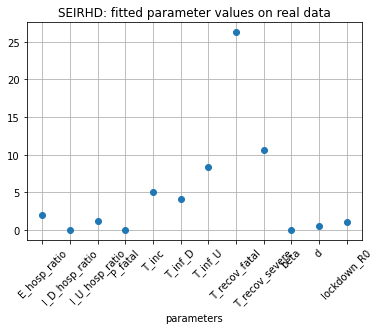

In [129]:
plt.figure()
plt.errorbar(df_params_stats.columns.to_list(), df_params_stats.iloc[0,:].to_list(),
            yerr=df_params_stats.iloc[1,:].to_list(),
            fmt='o', capsize=3)
plt.grid()
plt.xticks(rotation=45)
plt.xlabel('parameters')
plt.title('SEIRHD: fitted parameter values on real data')
plt.show()

In [126]:
df_train_loss = pd.DataFrame(train_loss_list)
df_best_train_loss = pd.DataFrame(best_train_loss_list, columns=['train'])
df_loss = pd.concat([df_train_loss, df_best_train_loss], axis=1, keys=['train','best'])
df_loss_stats = df_loss.describe().iloc[[1,2],:]

In [ ]:
plt.figure()
plt.errorbar([str(i) + " " + str(j) for i,j in df_loss_stats.columns.to_list()], 
            df_loss_stats.iloc[0,:].to_list(),
            yerr=df_loss_stats.iloc[1,:].to_list(),
            fmt='o', capsize=3)
plt.grid()
plt.xticks(rotation=45)
plt.xlabel('train loss')
plt.title('SEIRHD: loss values on real data')
plt.show()